# Plotting example for Boston 311 data

In this notebook we plot Boston's 311 data onto a map of Boston.

Data via https://data.boston.gov/dataset/311-service-requests

## Setup

First, be sure to run notebook **`R environment setup`** in this workspace.

Then in this section we:

1. install a few additional R packages
2. load the needed R packages

In [1]:
list.of.packages <- c("ggplot2", "lme4", "data.table", "fitdistrplus", "data.table", 
                      "speedglm", "hexbin", "poweRlaw", "splines", "statmod", "bit64", "RCurl",
                     "httr")
new.packages <- list.of.packages[!(list.of.packages %in% installed.packages()[,"Package"])]
if(length(new.packages)) install.packages(new.packages,repos = "http://cran.us.r-project.org")

Installing packages into ‘/home/jupyter-user/.rpackages’
(as ‘lib’ is unspecified)
also installing the dependencies ‘lsei’, ‘minqa’, ‘nloptr’, ‘RcppEigen’, ‘npsurv’



In [2]:
library(ggplot2)
library(data.table)
library(lme4)
library(fitdistrplus)
library(poweRlaw)
library(speedglm)
library(splines)
library(statmod)
library(RCurl)
library(httr)

Loading required package: Matrix
Warning message:
“package ‘Matrix’ was built under R version 3.5.3”Loading required package: MASS
Loading required package: survival
Warning message:
“package ‘survival’ was built under R version 3.5.3”Loading required package: npsurv
Loading required package: lsei
Loading required package: bitops


# Download data

In [3]:
# Data comes via a link from https://data.boston.gov/dataset/311-service-requests
# It yields a 403 error but that page with the 403 also provides you with a resolved URL that 
# contains a session token to download the raw data. By parsing the header, you can extract that 
# resolved URL.
lookup <- HEAD("https://data.boston.gov/dataset/8048697b-ad64-4bfc-b090-ee00169f2323/resource/2968e2c0-d479-49ba-a884-4ef523ada3c0/download/311.csv")
resolved_url <- ((lookup$all_headers[[1]])$headers)$location

In [4]:
# Note: This will give a warning about integer overflow. This is to be expected.
download <- getURL(resolved_url)

Warning message in nchar(str, "bytes") * 4L:
“NAs produced by integer overflow”

In [5]:
dat <- fread(text=download, 
            sep=",",
            header=TRUE,
            quote="\"",
            data.table=FALSE,
            check.names=TRUE)

In [6]:
str(dat)

'data.frame':	1427771 obs. of  29 variables:
 $ CASE_ENQUIRY_ID               :integer64 101002779138 101002779137 101002779136 101002779135 101002779133 101002779131 101002779130 101002779129 ... 
 $ open_dt                       : chr  "2019-01-17 23:58:17" "2019-01-17 23:48:28" "2019-01-17 23:46:00" "2019-01-17 23:46:33" ...
 $ target_dt                     : chr  "2019-02-04 08:30:00" "2019-02-04 08:30:00" "2019-01-23 08:30:00" "2019-01-22 08:30:00" ...
 $ closed_dt                     : chr  "" "" "" "" ...
 $ OnTime_Status                 : chr  "ONTIME" "ONTIME" "ONTIME" "ONTIME" ...
 $ CASE_STATUS                   : chr  "Open" "Open" "Open" "Open" ...
 $ CLOSURE_REASON                : chr  "" "" "" "" ...
 $ CASE_TITLE                    : chr  "Street Light Outages" "Street Light Outages" "Unsanitary Conditions - Establishment" "Parking Enforcement" ...
 $ SUBJECT                       : chr  "Public Works Department" "Public Works Department" "Inspectional Services" "Trans

In [7]:
head(dat)

CASE_ENQUIRY_ID,open_dt,target_dt,closed_dt,OnTime_Status,CASE_STATUS,CLOSURE_REASON,CASE_TITLE,SUBJECT,REASON,⋯,police_district,neighborhood,neighborhood_services_district,ward,precinct,LOCATION_STREET_NAME,LOCATION_ZIPCODE,Latitude,Longitude,Source
101002779138,2019-01-17 23:58:17,2019-02-04 08:30:00,,ONTIME,Open,,Street Light Outages,Public Works Department,Street Lights,⋯,D4,Boston,14,05,0510,656 Beacon St,2215,42.3493,-71.0960,City Worker App
101002779137,2019-01-17 23:48:28,2019-02-04 08:30:00,,ONTIME,Open,,Street Light Outages,Public Works Department,Street Lights,⋯,D4,Mission Hill,14,4,0410,INTERSECTION Louis Prang St & Ruggles St,NA,42.3594,-71.0587,City Worker App
101002779136,2019-01-17 23:46:00,2019-01-23 08:30:00,,ONTIME,Open,,Unsanitary Conditions - Establishment,Inspectional Services,Health,⋯,C11,Dorchester,8,Ward 17,1706,576 Washington St,2124,42.2915,-71.0715,Constituent Call
101002779135,2019-01-17 23:46:33,2019-01-22 08:30:00,,ONTIME,Open,,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,A7,East Boston,1,Ward 1,0101,128 Webster St,2128,42.3664,-71.0360,Citizens Connect App
101002779133,2019-01-17 23:41:50,2019-02-04 08:30:00,,ONTIME,Open,,Street Light Outages,Public Works Department,Street Lights,⋯,B2,Mission Hill,14,4,0410,INTERSECTION Vancouver St & Huntington Ave,NA,42.3594,-71.0587,City Worker App
101002779131,2019-01-17 23:09:59,2019-01-22 08:30:00,,ONTIME,Open,,Parking Enforcement,Transportation - Traffic Division,Enforcement & Abandoned Vehicles,⋯,D4,South End,6,Ward 5,0501,82 Chandler St,2116,42.3464,-71.0724,Citizens Connect App


In [8]:
length(dat[,1])

[1] 1427771

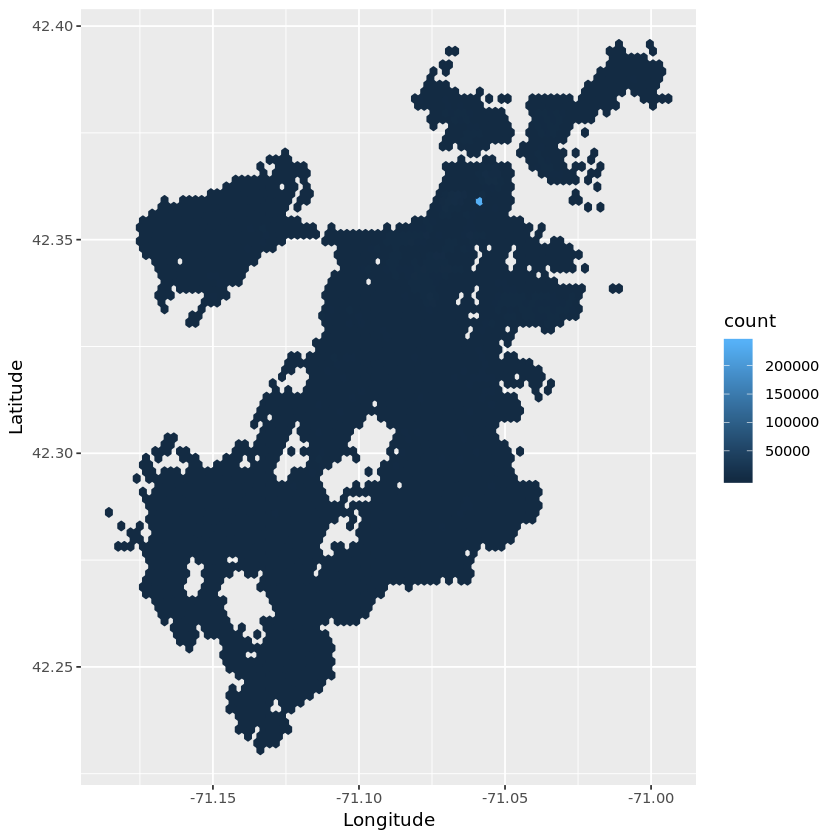

In [9]:
ggplot(dat) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=90)

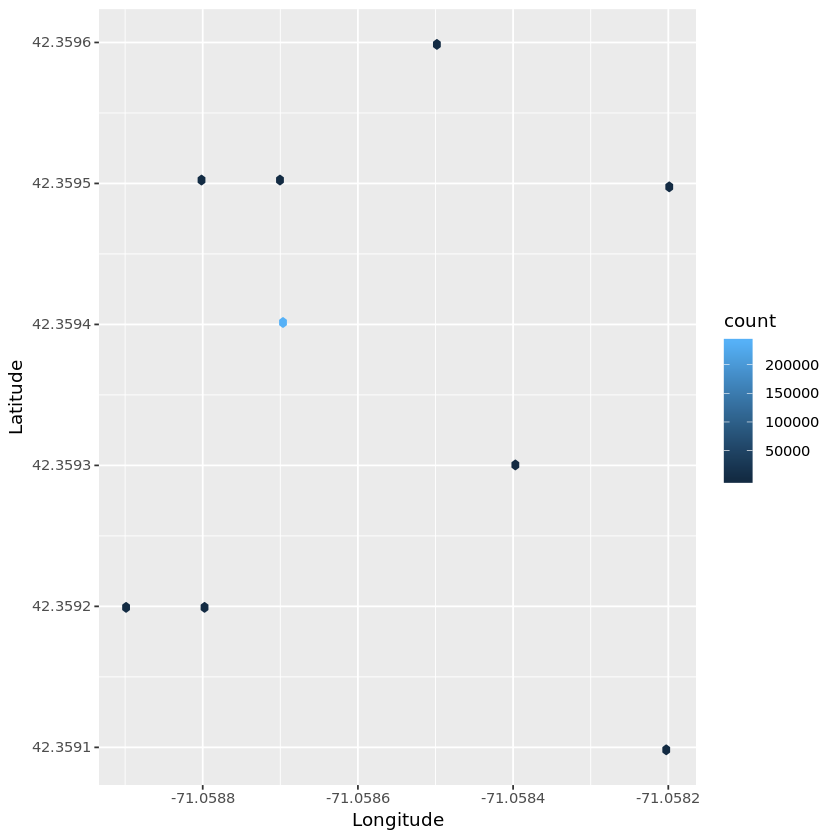

In [10]:
ggplot(dat[dat$Longitude < -71.058 & dat$Longitude > -71.059 & dat$Latitude < 42.36 & dat$Latitude > 42.359,]) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=90)

In [11]:
length(dat[dat$Latitude==42.3594 & dat$Longitude==-71.0587,1])

[1] 238907

It looks like any report without GPS coordinates gets assigned to City Hall. That's 218,654 reports as of 9/3/2018.

Let's remove City Hall and see how the report density actually varies:

In [12]:
notCityHall <- dat[!(dat$Latitude==42.3594 & dat$Longitude==-71.0587),]

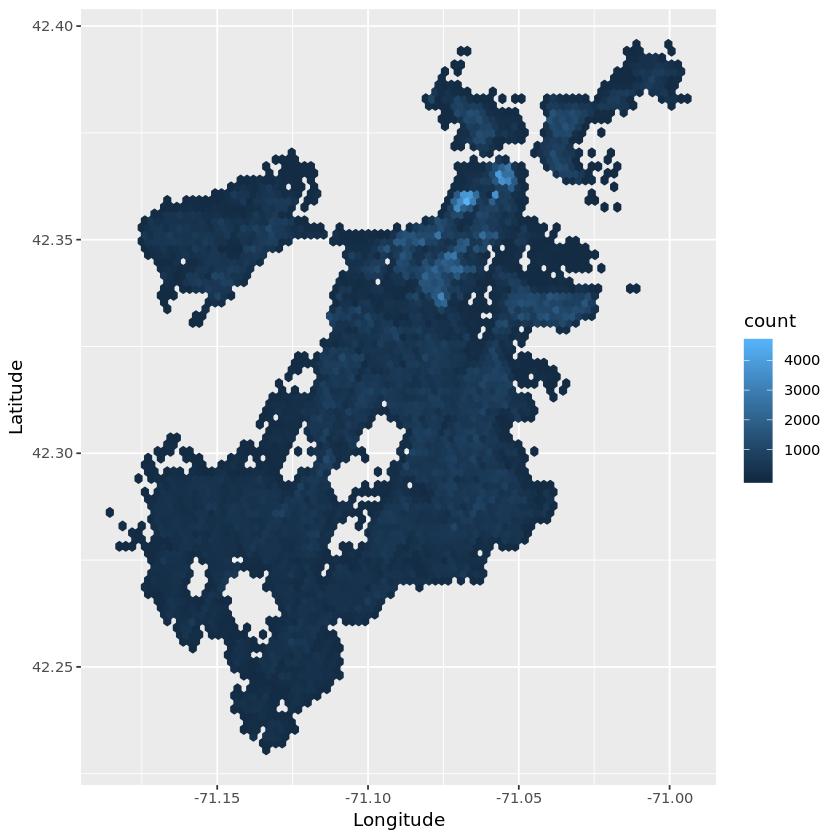

In [13]:
p0 <- ggplot(notCityHall) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=90)

print(p0)

# Needle pickup requests

In [14]:
needleCases <- notCityHall[grep("Needle", notCityHall$CASE_TITLE), ]

In [15]:
length(needleCases[,1])

[1] 8199

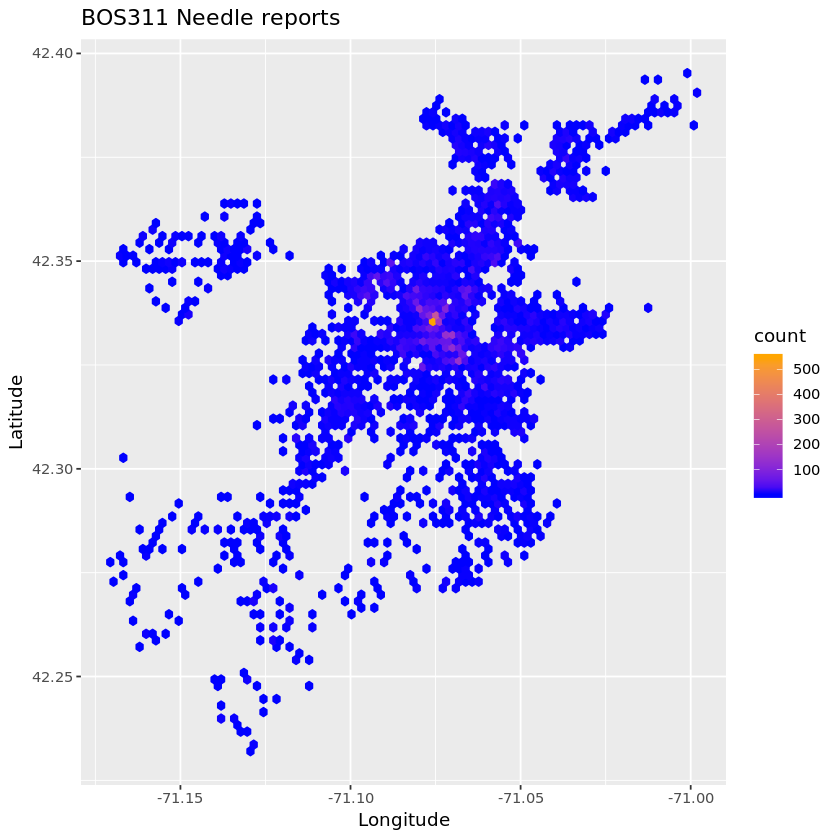

In [16]:
p <- ggplot(needleCases) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=90) + 
scale_colour_gradient(low = "blue", high = "orange") +
scale_fill_gradient(low = "blue", high = "orange") +
ggtitle("BOS311 Needle reports")
print(p)

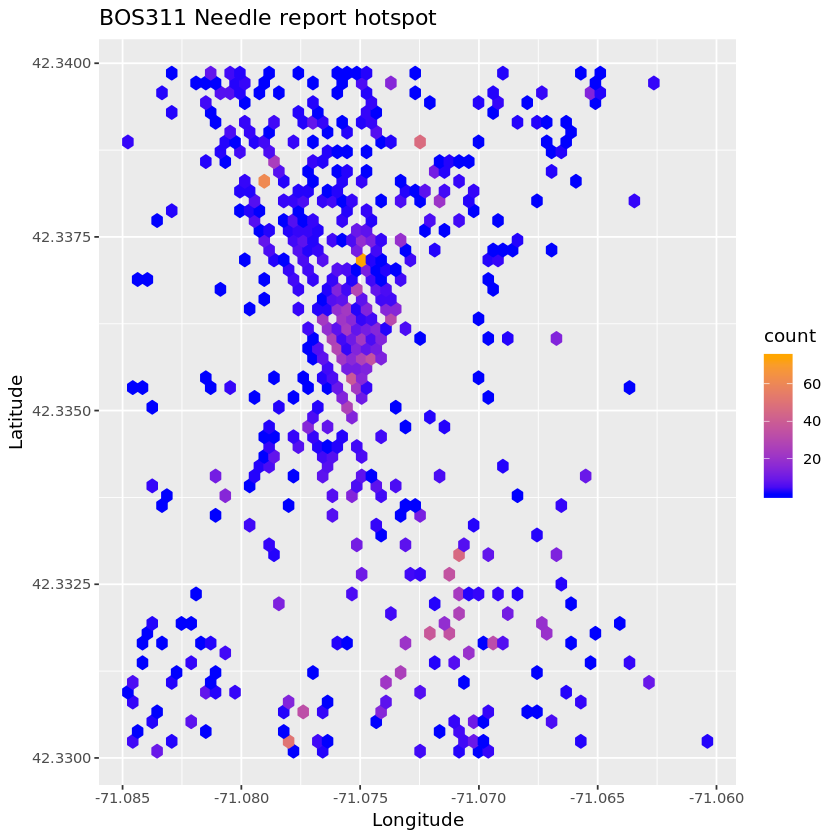

In [17]:
ggplot(needleCases[with(needleCases, Latitude>42.33 & Latitude < 42.34 & Longitude > -71.085 & Longitude < -71.06),]) +
geom_hex(aes(Longitude, Latitude, col=..count..), 
        bins=60) + 
scale_colour_gradient(low = "blue", high = "orange") +
scale_fill_gradient(low = "blue", high = "orange") +
ggtitle("BOS311 Needle report hotspot")

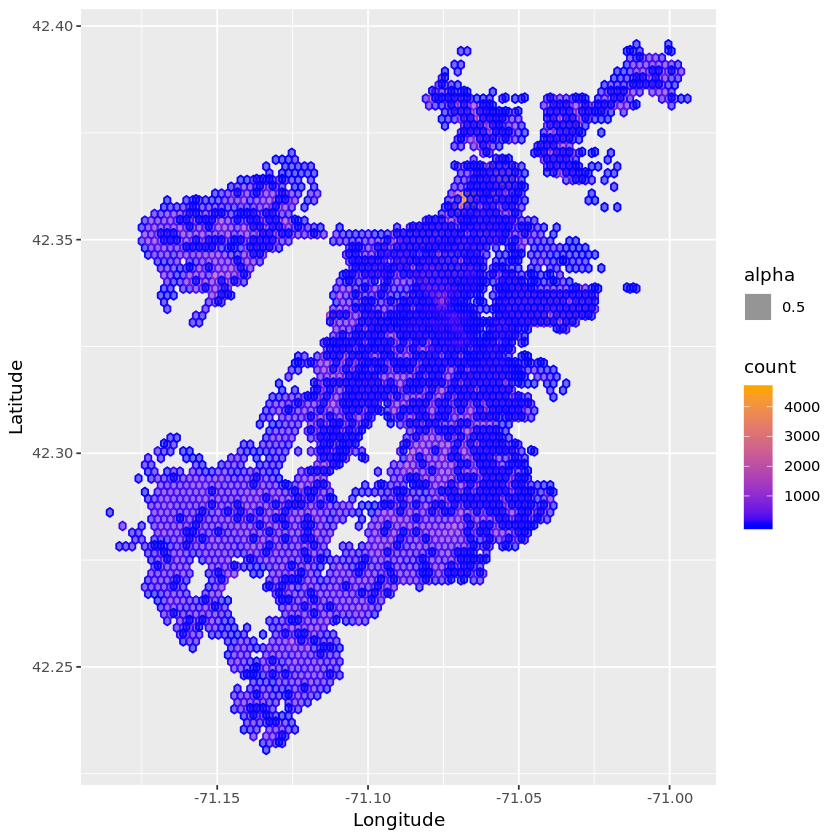

In [18]:
# Note: this is a failed overlay of the generic request density map and the needle pickup map
print(ggplot(notCityHall) + geom_hex(aes(Longitude, Latitude, alpha=0.5, col=..count..), bins=90) +
      geom_hex(data=needleCases, aes(Longitude, Latitude, alpha=0.5, col=..count..), bins=90) +
      scale_colour_gradient(low = "blue", high = "orange") +
      scale_fill_gradient(low = "blue", high = "orange"))

# What else can we plot?

In [19]:
ct <- as.data.frame(xtabs(~TYPE, data=notCityHall))
ct[order(-ct$Freq),]

,TYPE,Freq
153,Schedule a Bulk Item Pickup,105605
112,Parking Enforcement,88003
145,Requests for Street Cleaning,78956
85,Missed Trash/Recycling/Yard Waste/Bulk Item,74318
142,Request for Snow Plowing,57982
140,Request for Pothole Repair,49797
172,Street Light Outages,46087
128,Pothole Repair (Internal),32428
154,Schedule a Bulk Item Pickup SS,31678
70,Improper Storage of Trash (Barrels),31029


In [20]:
plotBOS <- function(df, case_title) {
        p <- ggplot(notCityHall[grep(case_title, notCityHall$CASE_TITLE), ]) +
    geom_hex(aes(Longitude, Latitude, col=..count..), 
            bins=90) + 
    scale_colour_gradient(low = "blue", high = "orange") +
    scale_fill_gradient(low = "blue", high = "orange") +
    ggtitle(case_title)
    print(p)
}

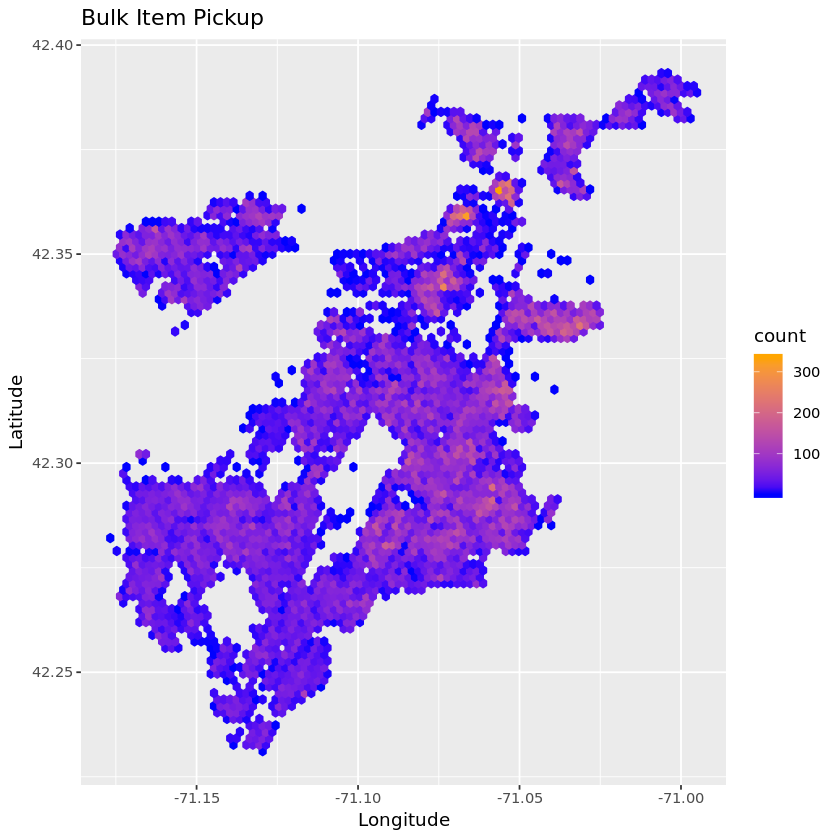

In [21]:
plotBOS(notCityHall, "Bulk Item Pickup")

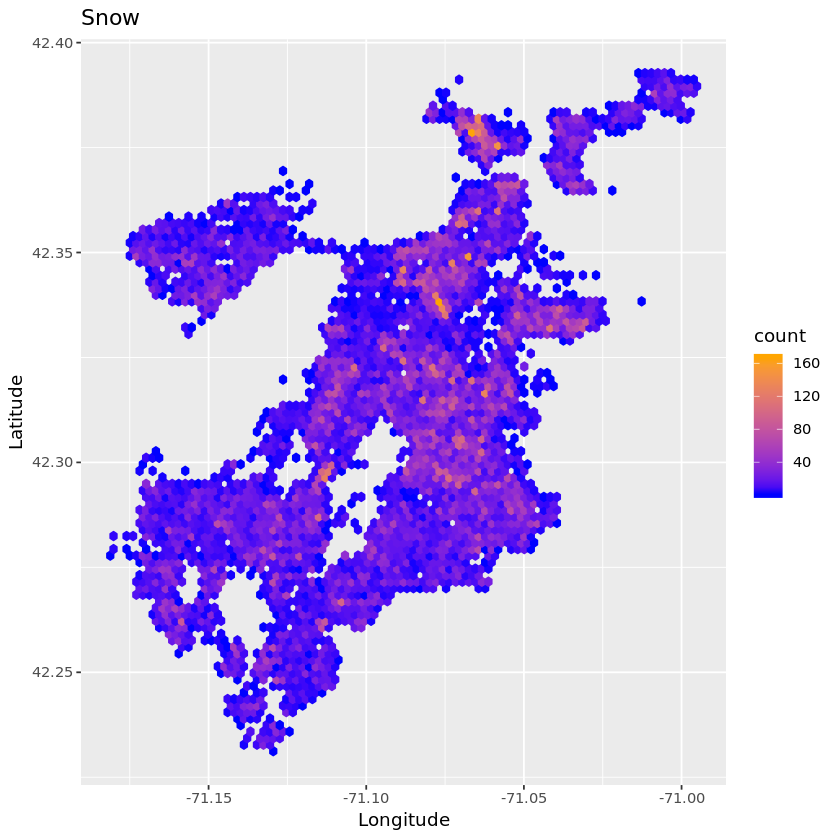

In [22]:
plotBOS(notCityHall, "Snow")

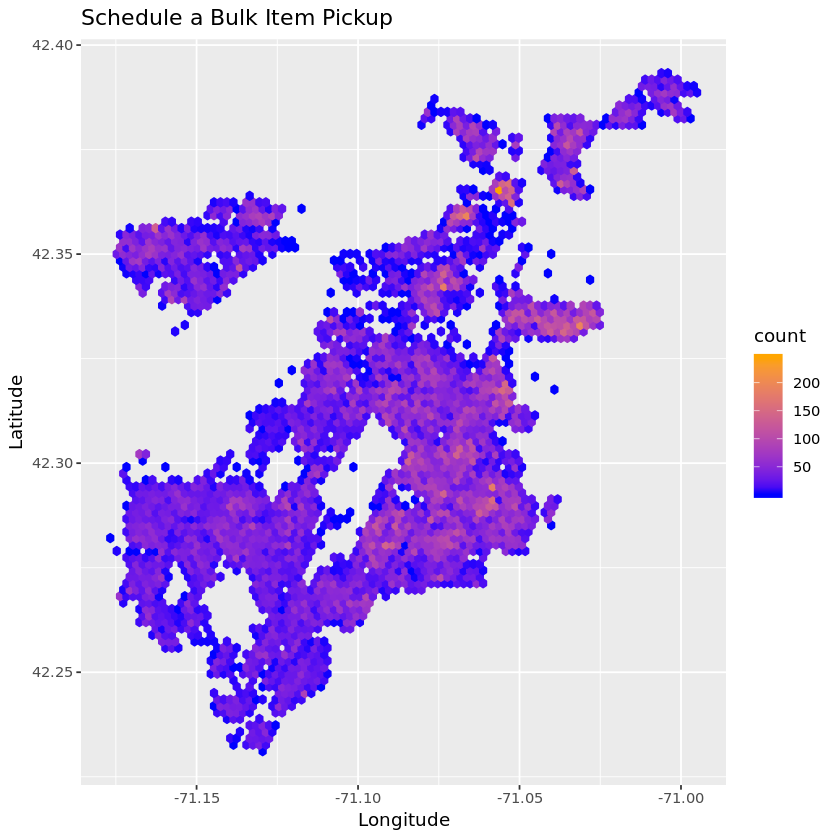

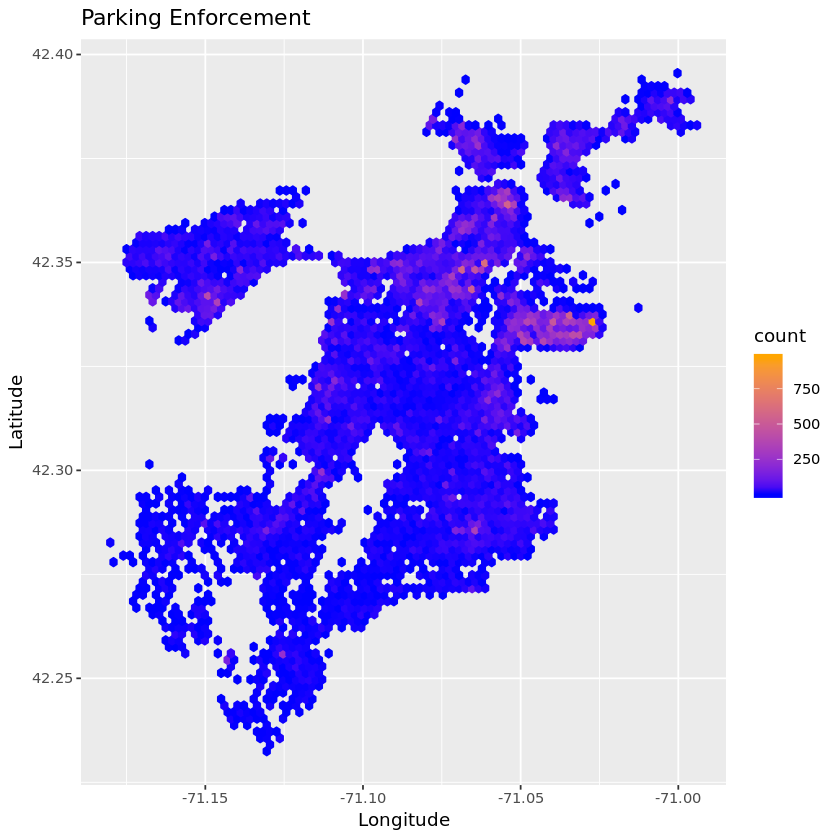

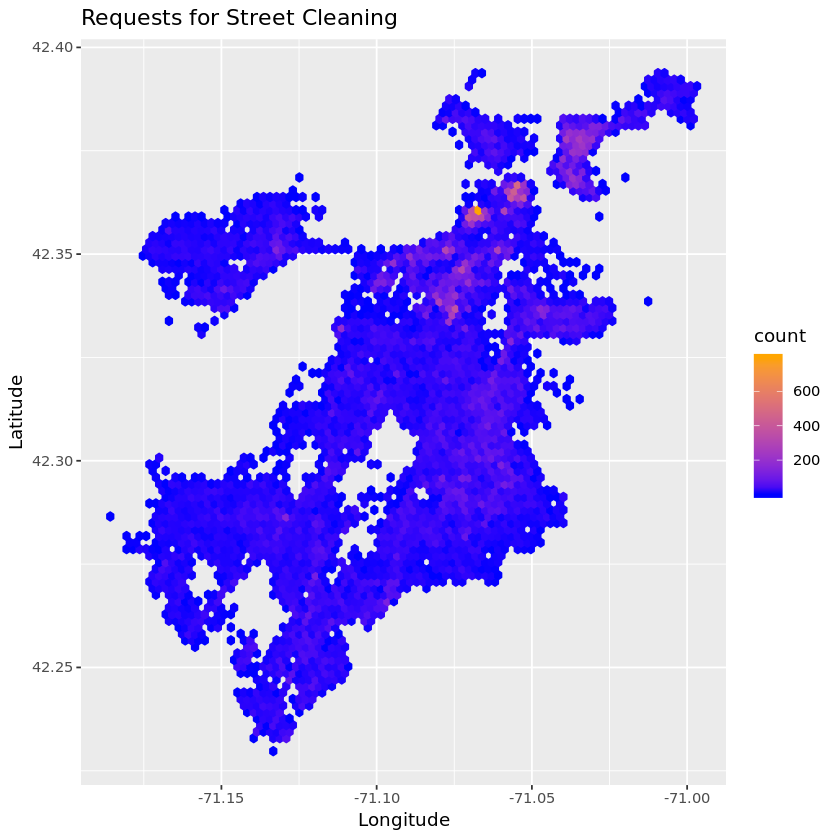

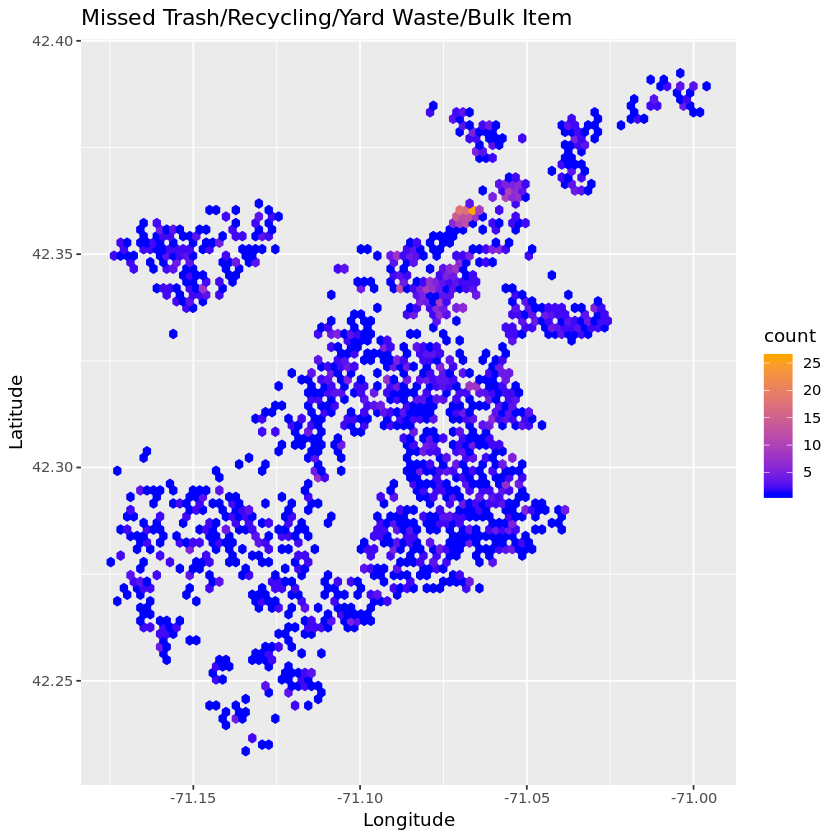

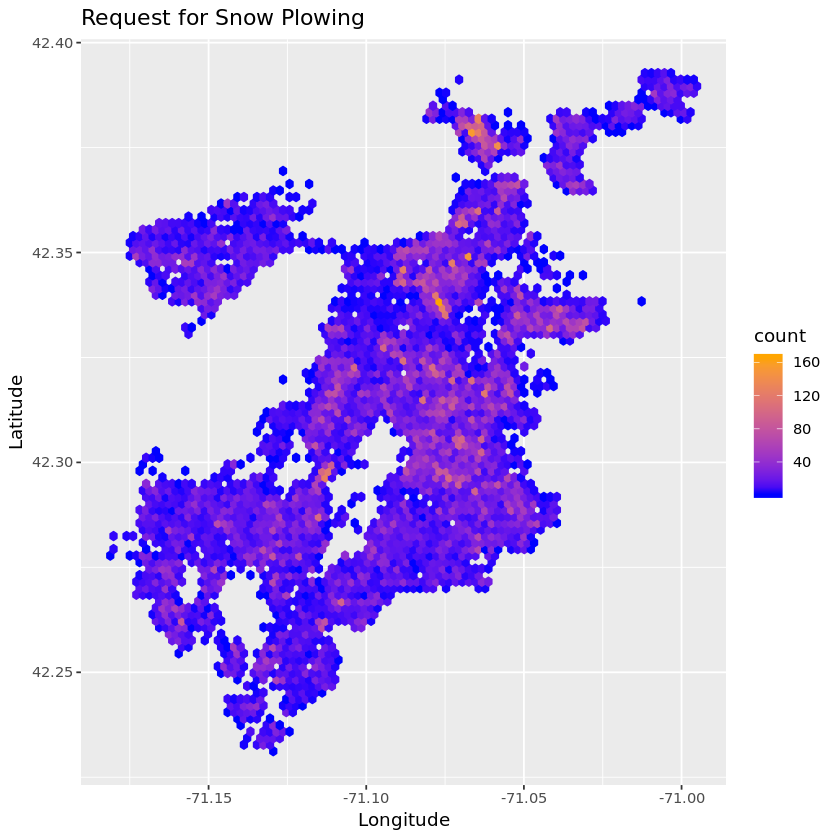

...

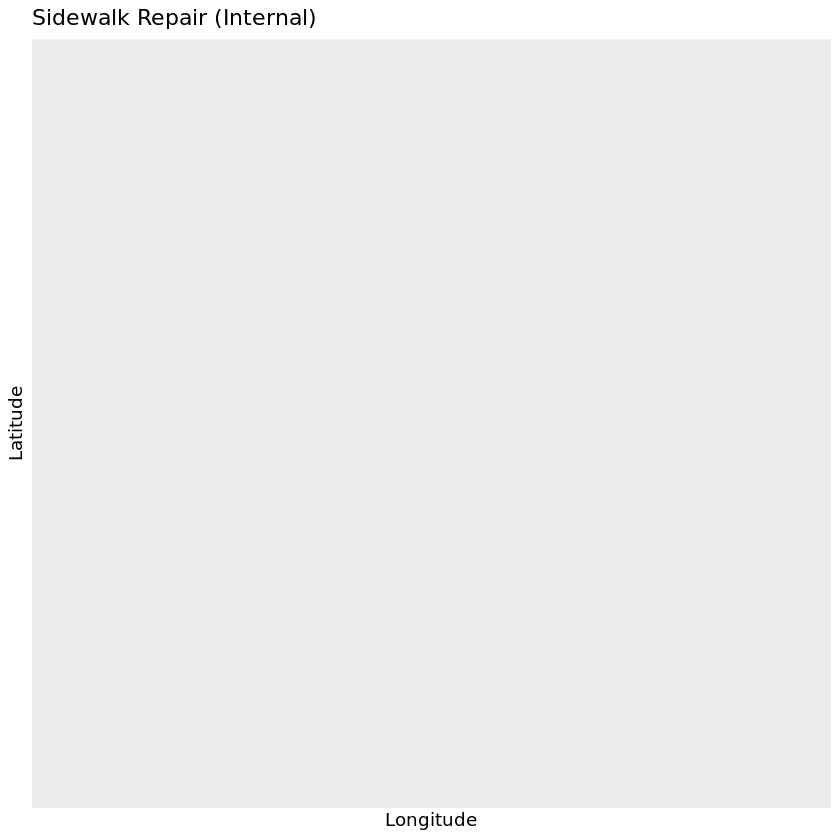

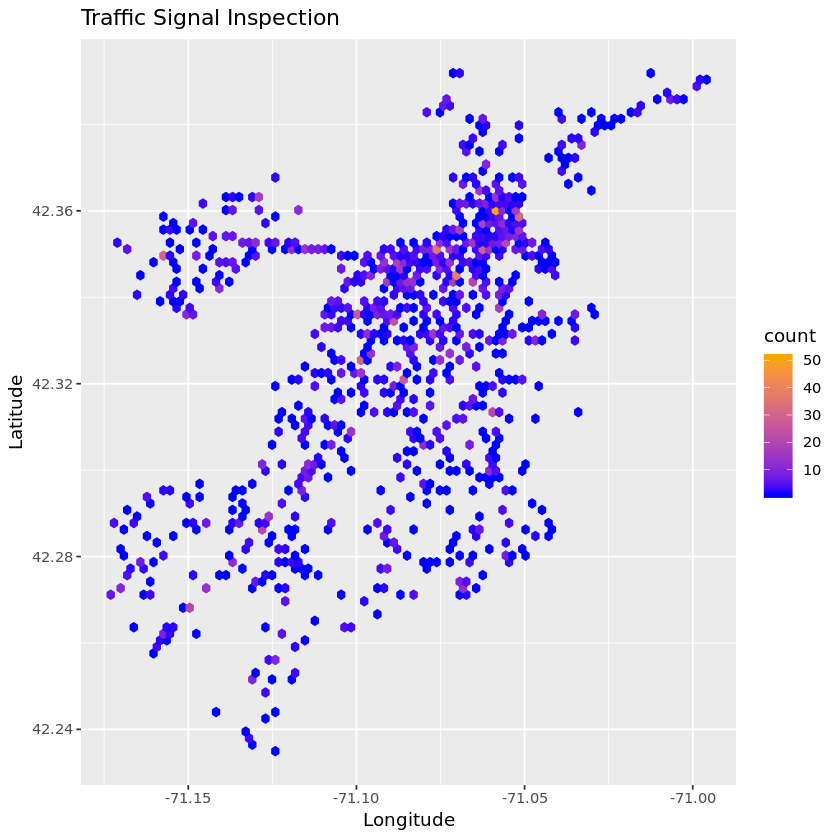

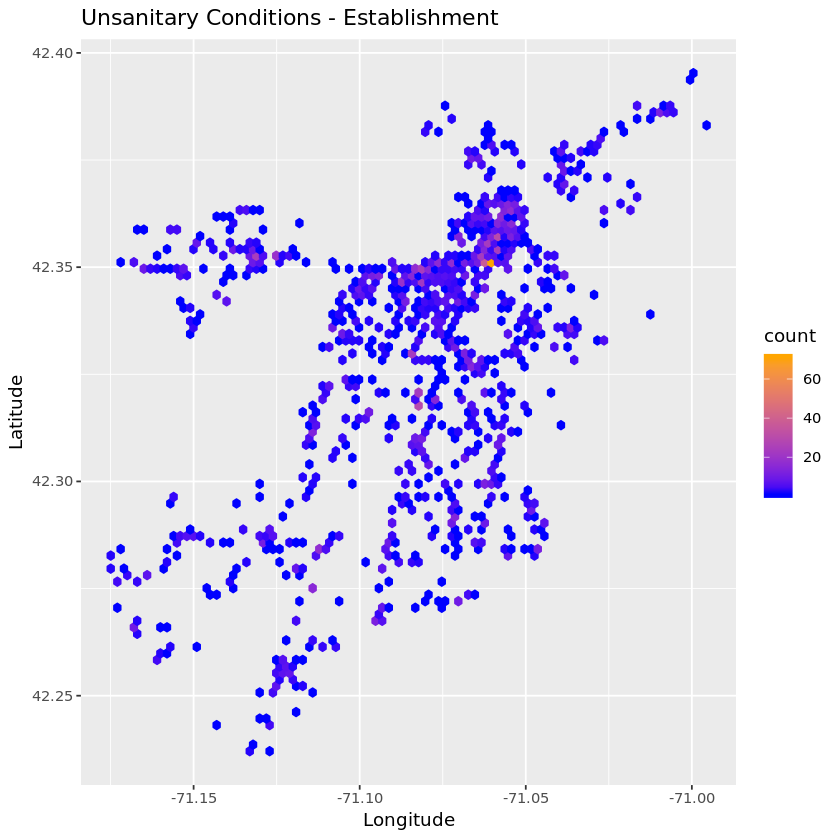

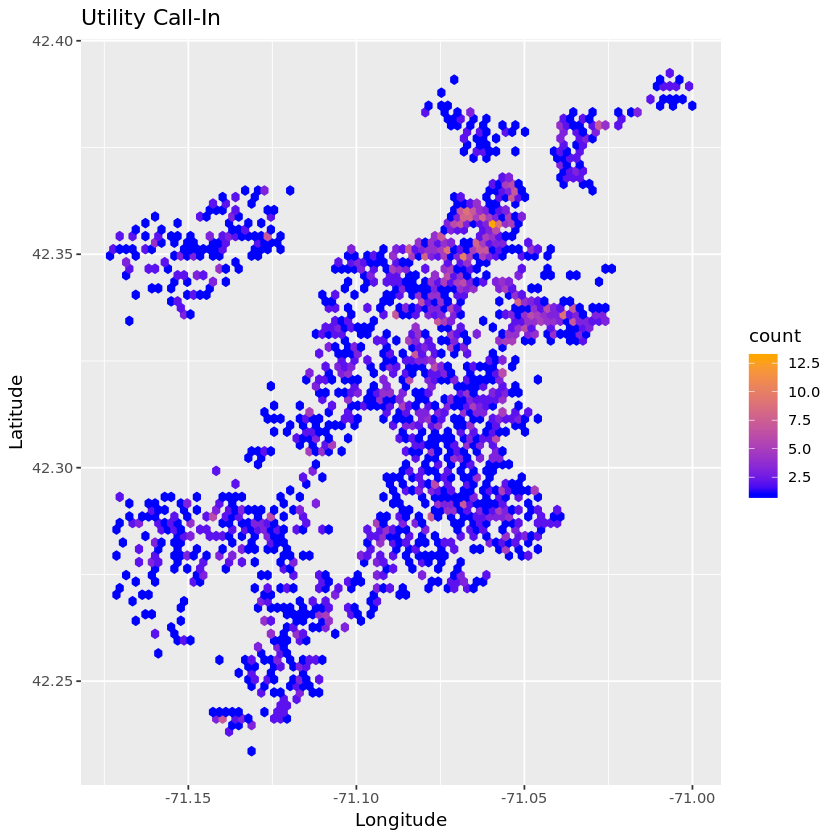

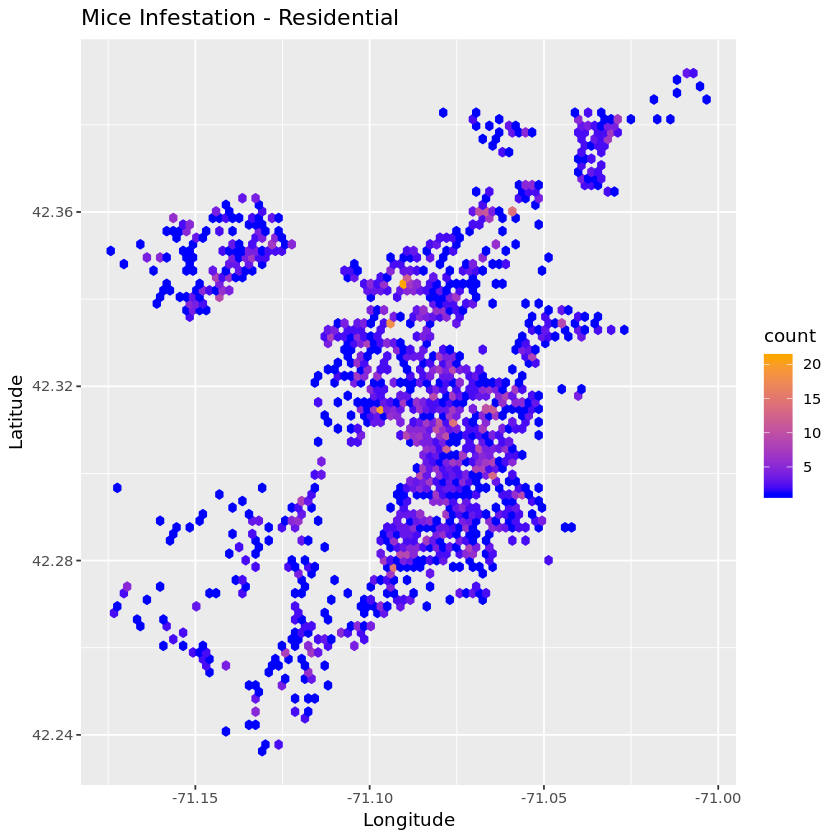

In [23]:
topTypes <- ct[order(-ct$Freq),]$TYPE[seq(1,60)]
for(type in topTypes) {
    plotBOS(notCityHall, type)
}

# Provenance

In [24]:
devtools::session_info()

─ Session info ───────────────────────────────────────────────────────────────
 setting  value                       
 version  R version 3.5.2 (2018-12-20)
 os       Debian GNU/Linux 9 (stretch)
 system   x86_64, linux-gnu           
 ui       X11                         
 language (EN)                        
 collate  en_US.UTF-8                 
 ctype    en_US.UTF-8                 
 tz       Etc/UTC                     
 date     2019-05-02                  

─ Packages ───────────────────────────────────────────────────────────────────
 package      * version     date       lib source                            
 assertthat     0.2.1       2019-03-21 [2] CRAN (R 3.5.2)                    
 backports      1.1.4       2019-04-10 [1] CRAN (R 3.5.2)                    
 base64enc      0.1-3       2015-07-28 [2] CRAN (R 3.5.2)                    
 bit            1.1-14      2018-05-29 [2] CRAN (R 3.5.2)                    
 bit64          0.9-7       2017-05-08 [2] CRAN (R 3.5.2)    

Copyright 2018 The Broad Institute, Inc., Verily Life Sciences, LLC All rights reserved.

This software may be modified and distributed under the terms of the BSD license. See the LICENSE file for details.